# RESNET VS JD - TRAINING ON GENERATIONS

In [1]:
import wandb
import matplotlib.pyplot as plt
import numpy as np

In [8]:
api = wandb.Api()

resnet_on_orig = [
"RESNET_CIFAR10_FIG1_SEED64",
"RESNET_CIFAR10_FIG1_SEED78",
"RESNET_CIFAR10_FIG1_SEED53",
]
resnet_on_synth = [
"RESNET_CIFAR10_FIG1_SYNTH_SEED78",
"RESNET_CIFAR10_FIG1_SYNTH_SEED53",
"RESNET_CIFAR10_FIG1_SYNTH_SEED15",
]
resnet_kd = [
"RESNET_CIFAR10_FIG1_KD_SEED78",
"RESNET_CIFAR10_FIG1_KD_SEED53",
"RESNET_CIFAR10_FIG1_KD_SEED15",
]
jd_on_orig = [
"CIFAR10_FIG1_SEED78",
"CIFAR10_FIG1_SEED64",
"CIFAR10_FIG1_SEED53",
]
jd_on_synth = [
"CIFAR10_FIG1_SYNTH_SEED14",
"CIFAR10_FIG1_SYNTH_SEED78",
"CIFAR10_FIG1_SYNTH_SEED53",
]
jd_kd = [
"CIFAR10_FIG1_KD_SEED78",
"CIFAR10_FIG1_KD_SEED53",
"CIFAR10_FIG1_KD_SEED64",
]
runs_dict = {}
for name, runs in [("resnet_on_orig", resnet_on_orig), ("resnet_on_synth", resnet_on_synth), ("resnet_kd", resnet_kd), ("jd_on_orig", jd_on_orig), ("jd_on_synth", jd_on_synth), ("jd_kd", jd_kd)]:
    runs = [api.run(f"pawel269/Joint-Diffusion-in-Latent-Space/{run}") for run in runs]
    runs_dict[name] = runs


# resnet_on_gen_from_ckpt = api.run("pawel269/Joint-Diffusion-in-Latent-Space/ResNet_2024-05-18T03-49-50")
# resnet_on_gen_no_ckpt = api.run("pawel269/Joint-Diffusion-in-Latent-Space/ResNet_2024-05-18T03-11-33")
# resnet_on_orig = api.run("pawel269/Joint-Diffusion-in-Latent-Space/ResNet_2024-05-18T02-27-10")
# jd_orig = api.run("pawel269/Joint-Diffusion-in-Latent-Space/JointDiffusionAugmentations_2024-05-07T22-31-03")
# jd_on_gen = api.run("pawel269/Joint-Diffusion-in-Latent-Space/JointDiffusionAugmentations_2024-05-17T04-14-14")

In [9]:
processed_runs_dict = {}
for name, runs in runs_dict.items():
    processed_runs = []
    for run in runs:
        step = []
        acc = []
        for row in run.scan_history(keys=["val/accuracy", "trainer/global_step"]):
            if row["val/accuracy"] == row["val/accuracy"]:
                acc.append(row["val/accuracy"] * 100)
                step.append(int(row["trainer/global_step"]))
        print(max(step), len(acc), len(step))
        processed_runs.append((np.array(step), np.array(acc)))
    processed_runs_dict[name] = processed_runs

    


# resnet_on_gen_from_ckpt_step = []
# resnet_on_gen_from_ckpt_acc = []
# for i, row in resnet_on_gen_from_ckpt.history(keys=["val/accuracy", "trainer/global_step"]).iterrows():
#     if row["val/accuracy"] == row["val/accuracy"]:
#         resnet_on_gen_from_ckpt_acc.append(row["val/accuracy"] * 1000)
#         resnet_on_gen_from_ckpt_step.append(int(row["trainer/global_step"]))

# resnet_on_gen_no_ckpt_step = []
# resnet_on_gen_no_ckpt_acc = []
# for i, row in resnet_on_gen_no_ckpt.history(keys=["val/accuracy", "trainer/global_step"]).iterrows():
#     if row["val/accuracy"] == row["val/accuracy"]:
#         resnet_on_gen_no_ckpt_acc.append(row["val/accuracy"] * 1000)
#         resnet_on_gen_no_ckpt_step.append(int(row["trainer/global_step"]))

# resnet_on_orig_step = []
# resnet_on_orig_acc = []
# for i, row in resnet_on_orig.history(keys=["val/accuracy", "trainer/global_step"]).iterrows():
#     if row["val/accuracy"] == row["val/accuracy"]:
#         resnet_on_orig_acc.append(row["val/accuracy"] * 1000)
#         resnet_on_orig_step.append(int(row["trainer/global_step"]))

# jd_orig_step = []
# jd_orig_acc = []
# for i, row in jd_orig.history(keys=["val/accuracy", "trainer/global_step"]).iterrows():
#     if row["val/accuracy"] == row["val/accuracy"]:
#         jd_orig_acc.append(row["val/accuracy"] * 1000)
#         jd_orig_step.append(int(row["trainer/global_step"]))

# jd_on_gen_step = []
# jd_on_gen_acc = []
# for i, row in jd_on_gen.history(keys=["val/accuracy", "trainer/global_step"]).iterrows():
#     if row["val/accuracy"] == row["val/accuracy"]:
#         jd_on_gen_acc.append(row["val/accuracy"] * 1000)
#         jd_on_gen_step.append(int(row["trainer/global_step"]))

99839 512 512
99839 512 512
99839 512 512
999959 2564 2564
999959 2564 2564
999959 2564 2564
999959 2564 2564
999959 2564 2564
999959 2564 2564
99839 512 512
99839 512 512
99839 512 512
661439 1696 1696
690299 1770 1770
696539 1786 1786
514019 1318 1318
509339 1306 1306
516359 1324 1324


In [10]:
for name in ["resnet_on_orig", "jd_on_orig"]:
    avg_acc = 0
    for steps, acc in processed_runs_dict[name]:
        avg_acc += acc
    avg_acc /= 3
    processed_runs_dict[name] = (steps, avg_acc)

In [11]:
max_steps = 891

for name in ["resnet_on_synth", "resnet_kd", "jd_on_synth", "jd_kd"]:
    avg_acc = 0
    for steps, acc in processed_runs_dict[name]:
        avg_acc += acc[:max_steps]
    avg_acc /= 3
    processed_runs_dict[name] = (steps[:max_steps] + 99839, avg_acc)

In [12]:
ema_exp = 0.98
skip_first_n = 80

to_plot = {}
for name in ["resnet_on_synth", "resnet_kd"]:
    step_orig, acc_orig = processed_runs_dict["resnet_on_orig"]
    step_synth, acc_synth = processed_runs_dict[name]
    step = list(step_orig) + list(step_synth)
    acc = list(acc_orig) + list(acc_synth)
    acc_ema = [acc[0]]
    curr_acc = acc[0]
    for acc in acc[1:]:
        curr_acc = curr_acc * ema_exp + acc * (1 - ema_exp)
        acc_ema.append(curr_acc)
    to_plot[name] = (step[skip_first_n:], acc_ema[skip_first_n:])
for name in ["jd_on_synth", "jd_kd"]:
    step_orig, acc_orig = processed_runs_dict["jd_on_orig"]
    step_synth, acc_synth = processed_runs_dict[name]
    step = list(step_orig) + list(step_synth)
    acc = list(acc_orig) + list(acc_synth)
    acc_ema = [acc[0]]
    curr_acc = acc[0]
    for acc in acc[1:]:
        curr_acc = curr_acc * ema_exp + acc * (1 - ema_exp)
        acc_ema.append(curr_acc)
    to_plot[name] = (step[skip_first_n:], acc_ema[skip_first_n:])

In [85]:
for name in ["resnet_on_synth", "resnet_kd", "jd_on_synth", "jd_kd"]:
    print(processed_runs_dict[name][0])

[100228 100618 101008 101398 101788 102178 102568 102958 103348 103738
 104128 104518 104908 105298 105688 106078 106468 106858 107248 107638
 108028 108418 108808 109198 109588 109978 110368 110758 111148 111538
 111928 112318 112708 113098 113488 113878 114268 114658 115048 115438
 115828 116218 116608 116998 117388 117778 118168 118558 118948 119338
 119728 120118 120508 120898 121288 121678 122068 122458 122848 123238
 123628 124018 124408 124798 125188 125578 125968 126358 126748 127138
 127528 127918 128308 128698 129088 129478 129868 130258 130648 131038
 131428 131818 132208 132598 132988 133378 133768 134158 134548 134938
 135328 135718 136108 136498 136888 137278 137668 138058 138448 138838
 139228 139618 140008 140398 140788 141178 141568 141958 142348 142738
 143128 143518 143908 144298 144688 145078 145468 145858 146248 146638
 147028 147418 147808 148198 148588 148978 149368 149758 150148 150538
 150928 151318 151708 152098 152488 152878 153268 153658 154048 154438
 15482

In [ ]:
resnet_gen_step = [s + 60000 for s in resnet_on_gen_no_ckpt_step if s + 60000 <= 105248]
resnet_gen_acc_ema = [resnet_on_gen_no_ckpt_acc[0]]
curr_acc = resnet_on_gen_no_ckpt_acc[0]
for acc in resnet_on_gen_no_ckpt_acc[1:]:
    curr_acc = curr_acc * 0.95 + acc * 0.05
    resnet_gen_acc_ema.append(curr_acc)
resnet_gen_acc_ema = resnet_gen_acc_ema[:len(resnet_gen_step)]

In [5]:
jd_orig_step[-2:]

[143499, 143999]

In [ ]:
jd_acc = jd_orig_acc[:60] + jd_orig_acc[-60:]+ jd_on_gen_acc
jd_acc_ema = [jd_acc[0]]
curr_acc = jd_acc[0]
for acc in jd_acc[1:]:
    curr_acc = curr_acc * 0.97 + acc * 0.03
    jd_acc_ema.append(curr_acc)
jd_step = jd_orig_step[:120] + [s + 59999 + 500 for s in jd_on_gen_step]

In [7]:
jd_step[-1]

105248

In [8]:
resnet_on_orig_step[-2:]

[59499, 59999]

In [9]:
resnet_acc = resnet_on_orig_acc + resnet_on_gen_from_ckpt_acc
resnet_acc_ema = [resnet_acc[0]]
curr_acc = resnet_acc[0]
for acc in resnet_acc[1:]:
    curr_acc = curr_acc * 0.95 + acc * 0.05
    resnet_acc_ema.append(curr_acc)
resnet_step = resnet_on_orig_step + [s + 59999 + 500 for s in resnet_on_gen_from_ckpt_step if s + 59999 + 500 <= 105248]
resnet_acc_ema = resnet_acc_ema[:len(resnet_step)]

In [10]:
len(resnet_step)

209

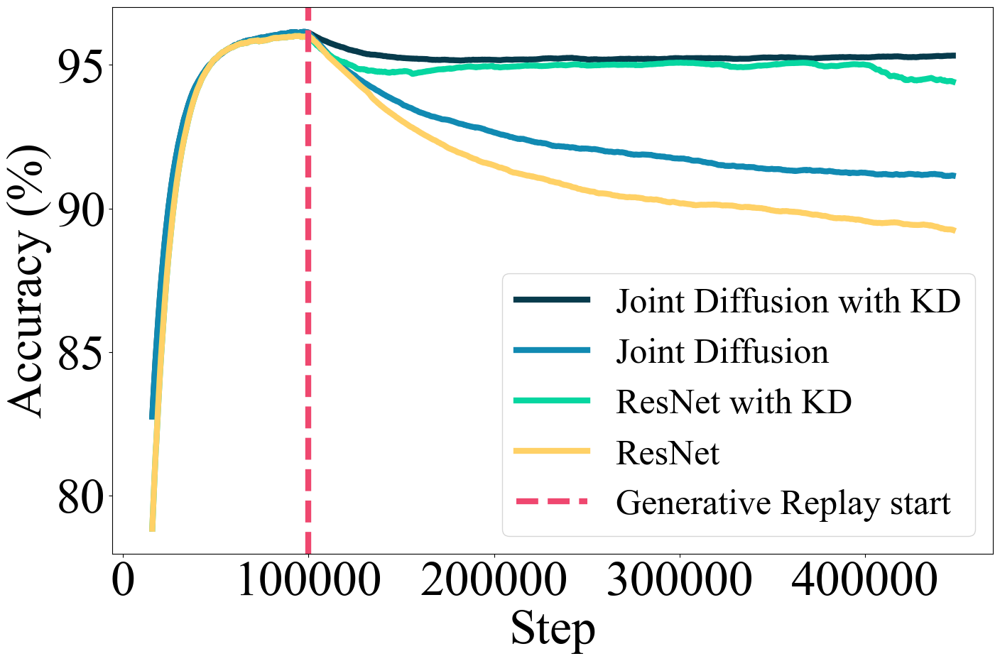

In [ ]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['text.usetex'] = False
mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

nice_fonts = {
    # "text.usetex": True,
    "font.family": "serif",
    "font.serif" : "Times New Roman",
    "font.size": 36,
    "axes.labelsize": 50,  
    "xtick.labelsize": 50, 
    "ytick.labelsize": 50,
    "lines.linewidth": 6,
}
mpl.rcParams.update(nice_fonts)

save_fig_opt = {
    'dpi': 800,
    'transparent':True, 
    'bbox_inches':'tight', 
    'pad_inches': 0
}

plt.figure(figsize=(16, 10))
plt.plot(to_plot["jd_kd"][0], to_plot["jd_kd"][1], label='Joint Diffusion with KD', color='#06d6a0')
plt.plot(to_plot["jd_on_synth"][0], to_plot["jd_on_synth"][1], label='Joint Diffusion', color='#ffd166')
plt.plot(to_plot["resnet_kd"][0], to_plot["resnet_kd"][1], label='ResNet with KD', color='#073b4c')
plt.plot(to_plot["resnet_on_synth"][0], to_plot["resnet_on_synth"][1], label='ResNet', color='#118ab2')
# plt.plot([s / 500 for s in jd_step], jd_acc_ema, label='Joint Diffusion', color='g')
# plt.plot([s / 500 for s in resnet_step], resnet_acc_ema, label='ResNet', color='b')
# plt.plot([s / 500 for s in resnet_gen_step], resnet_gen_acc_ema, label="ResNet (generations)", color="g")

# Draw a vertical line at x=5
plt.axvline(x=100000, color='#ef476f', linestyle='--', label='Generative Replay start')

# Add labels and title
plt.xlabel('Step')
plt.ylabel('Accuracy (%)')
# plt.title('Knowledge transfer effectiveness comparison')

# Add a legend
plt.legend()

plt.savefig("joint_vs_separate.pdf", bbox_inches="tight")
# Show the plot
plt.show()

# AVERAGE FORGETTING

In [3]:
import torch
from omegaconf import OmegaConf
from tqdm import tqdm
from dataloading import get_datasets
from models import get_model_class

/home/pawel/miniconda3/envs/ldm/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-07-07 20:49:48.689432: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-07 20:49:49.004331: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-07 20:49:49.076420: W tensorflow/compiler/xla/stream_executor/platform/default/dso

In [4]:
config_path = "configs/standard_diffusion/continual_learning/joint_diffusion_pooling/cifar100/10_tasks/cifar100_sigle_task.yaml"
checkpoint_paths = [
    "pulled_checkpoints/cifar100_10t_sup/t1.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t2_s84.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t3_s84.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t4_s84.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t5_s84.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t6_s84.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t7_s84.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t8_s84.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t9_s84.ckpt",
    "pulled_checkpoints/cifar100_10t_sup/t10_s84.ckpt",
]

In [5]:
config = OmegaConf.load(config_path)

dl_config_orig = config.pop("dataloaders")
dl_config = OmegaConf.to_container(dl_config_orig, resolve=True)
tasks_datasets, tasks_bs, test_ds, test_bs, tasks = get_datasets(dl_config)

model_type = config.model.get("model_type")
params = config.model.get("params", dict())

Files already downloaded and verified
Files already downloaded and verified


In [7]:

config.model.params["ckpt_path"] = "pulled_checkpoints/cifar100T10_5.ckpt"
model = get_model_class(model_type)(**params)
model = model.to(torch.device("cuda"))
model.eval()
tasks_check = [0, 1, 2, 3, 4]
# print(f"task {i} model")
task_results = []
with model.ema_scope():
    for task in tasks_check:
        classes = tasks[task]
        print(classes)
        ok = 0
        all = 0
        for data in tqdm(test_ds):
            y = data[1]
            x = data[0].unsqueeze(0).to(model.device)
            if int(y) in classes:
                representations = model.model.diffusion_model.just_representations(
                    x,
                    torch.zeros(x.shape[0], device=model.device),
                    pooled=False
                )
                representations = model.transform_representations(representations)
                preds = model.classifier(representations)
                ok += torch.argmax(preds, dim=1) == y
                all += 1
        print(f"accuracy on task {task} = {float(ok/all)}")
        task_results.append(float(ok/all) * 100)

JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100T10_5.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bias', 'model_ema.diffusion_modelinp

100%|██████████| 10000/10000 [00:06<00:00, 1502.71it/s]


accuracy on task 0 = 0.4820000231266022
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19]


100%|██████████| 10000/10000 [00:06<00:00, 1663.76it/s]


accuracy on task 1 = 0.37400001287460327
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


100%|██████████| 10000/10000 [00:05<00:00, 1705.90it/s]


accuracy on task 2 = 0.4690000116825104
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39]


100%|██████████| 10000/10000 [00:06<00:00, 1626.55it/s]


accuracy on task 3 = 0.46000000834465027
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


100%|██████████| 10000/10000 [00:06<00:00, 1659.77it/s]

accuracy on task 4 = 0.8530000448226929


In [21]:
tasks_check = []
results3 = []
for i, checkpoint_path in enumerate(checkpoint_paths):
    config.model.params["ckpt_path"] = checkpoint_path
    model = get_model_class(model_type)(**params)
    model = model.to(torch.device("cuda"))
    model.eval()
    tasks_check.append(i)
    print(f"task {i} model")
    task_results = []
    with model.ema_scope():
        for task in tasks_check:
            classes = tasks[task]
            print(classes)
            ok = 0
            all = 0
            for data in tqdm(test_ds):
                y = data[1]
                x = data[0].unsqueeze(0).to(model.device)
                if int(y) in classes:
                    representations = model.model.diffusion_model.just_representations(
                        x,
                        torch.zeros(x.shape[0], device=model.device),
                        pooled=False
                    )
                    representations = model.transform_representations(representations)
                    preds = model.classifier(representations)
                    ok += torch.argmax(preds, dim=1) == y
                    all += 1
            print(f"accuracy on task {task} = {float(ok/all)}")
            task_results.append(float(ok/all) * 100)
    results3.append(task_results)
for r in results3:
    print(r)

JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_10t_sup/t1.ckpt with 446 missing and 466 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bias', 'model_ema.diffusion_mod

100%|██████████| 10000/10000 [00:05<00:00, 1688.98it/s]


accuracy on task 0 = 0.9390000700950623
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_10t_sup/t2_s84.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_block

100%|██████████| 10000/10000 [00:06<00:00, 1631.44it/s]


accuracy on task 0 = 0.8080000281333923
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19]


100%|██████████| 10000/10000 [00:05<00:00, 1849.80it/s]


accuracy on task 1 = 0.8220000267028809
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_10t_sup/t3_s84.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_block

100%|██████████| 10000/10000 [00:05<00:00, 1825.30it/s]


accuracy on task 0 = 0.6890000104904175
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19]


100%|██████████| 10000/10000 [00:05<00:00, 1786.41it/s]


accuracy on task 1 = 0.6830000281333923
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


100%|██████████| 10000/10000 [00:05<00:00, 1849.95it/s]


accuracy on task 2 = 0.8230000138282776
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_10t_sup/t4_s84.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_block

100%|██████████| 10000/10000 [00:05<00:00, 1815.53it/s]


accuracy on task 0 = 0.612000048160553
[10, 11, 12, 13, 14, 15, 16, 17, 18, 19]


100%|██████████| 10000/10000 [00:05<00:00, 1895.08it/s]


accuracy on task 1 = 0.4740000367164612
[20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


100%|██████████| 10000/10000 [00:05<00:00, 1796.62it/s]


accuracy on task 2 = 0.6820000410079956
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39]


100%|██████████| 10000/10000 [00:05<00:00, 1778.52it/s]


accuracy on task 3 = 0.7680000066757202
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.


In [16]:
def avg_forgetting(results):
    forgetting = []
    for i in range(len(results)):
        f = max([res[i] for res in results[i:]]) - results[-1][i]
        forgetting.append(f)
    return sum(forgetting) / (len(forgetting) - 1)


    # "pulled_checkpoints/cifar100_t5/t4_s12.ckpt",
    # "pulled_checkpoints/cifar100_t5/t5_s12.ckpt",

# from dataloading import BaseTensorDataset
# import torchvision.transforms as T

# imgs = torch.load("pulled_checkpoints/CL_CIFAR100T5_SUP_TASK1-5_SEED12_imgs.pt")
# labels = torch.load("pulled_checkpoints/CL_CIFAR100T5_SUP_TASK1-5_SEED12_labels.pt")
# gen_ds = BaseTensorDataset(
#     data=imgs,
#     targets=labels.numpy(),
#     transform=T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
# )


# config.model.params["ckpt_path"] = "pulled_checkpoints/cifar100_t5/t5_s12.ckpt"
# model = get_model_class(model_type)(**params)
# model = model.to(torch.device("cuda"))
# model.eval()
# tasks_check = [0, 1, 2, 3, 4]
# print(f"task {i} model")
# task_results = []
# # with model.ema_scope():
# for task in tasks_check:
#     classes = tasks[task]
#     print(classes)
#     ok = 0
#     all = 0
#     for data in tqdm(gen_ds):
#         y = data[1]
#         x = data[0].unsqueeze(0).to(model.device)
#         if int(y) in classes:
#             representations = model.model.diffusion_model.just_representations(
#                 x,
#                 torch.zeros(x.shape[0], device=model.device),
#                 pooled=False
#             )
#             representations = model.transform_representations(representations)
#             preds = model.classifier(representations)
#             ok += torch.argmax(preds, dim=1) == y
#             all += 1
#     print(f"accuracy on task {task} = {float(ok/all)}")
#     task_results.append(float(ok/all) * 100)

In [17]:
import numpy as np

arr = np.array([avg_forgetting(res) for res in [ results3]])
print(arr.mean(), arr.std())

59.46666960501008 0.0


# HEATMAP - ACCURACY PER TASK

In [7]:
import numpy as np
import matplotlib.pyplot as plt


def result_to_np(result):
    res = []
    for i in range(len(result)):
        res.append([r[i] if j >= i else 0 for j, r in enumerate(result) ])
    return np.array(res)

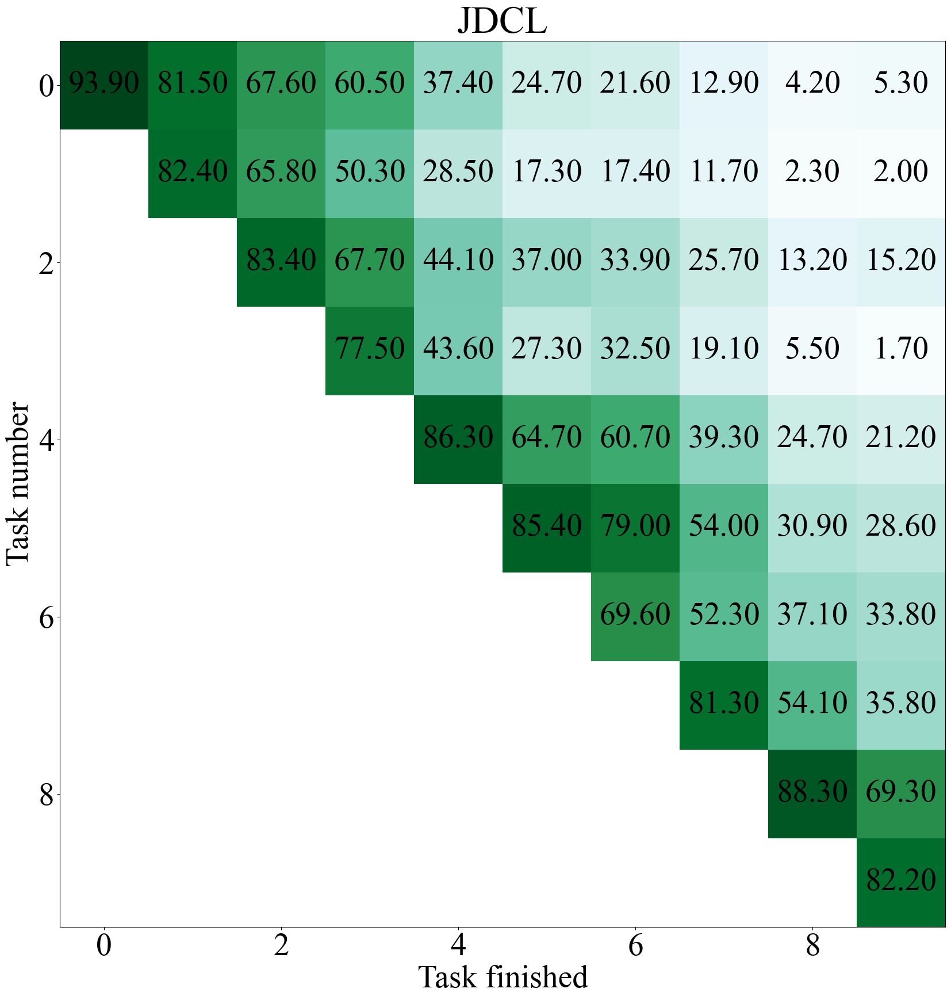

In [18]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['text.usetex'] = False
mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

nice_fonts = {
    # "text.usetex": True,
    "font.family": "serif",
    "font.serif" : "Times New Roman",
    "font.size": 40,
    "axes.labelsize": 40,  
    "xtick.labelsize": 40, 
    "ytick.labelsize": 40,
    "lines.linewidth": 6,
}
mpl.rcParams.update(nice_fonts)

save_fig_opt = {
    'dpi': 800,
    'transparent':True, 
    'bbox_inches':'tight', 
    'pad_inches': 0
}
# results3 = [
#     [0.999000072479248],
#     [0.9895000457763672, 0.9630000591278076],
#     [0.9860000610351562, 0.7535000443458557, 0.9530000686645508],
#     [0.9795000553131104, 0.5745000243186951, 0.8825000524520874, 0.9845000505447388],
#     [0.9300000667572021, 0.5139999985694885, 0.8600000143051147, 0.9740000367164612, 0.9725000262260437],
# ]

data1 = np.array([
    [90.15000463, 82.85000324, 75.10000467, 62.25000024, 39.60000277],
    [ 0.        , 71.15000486, 60.1000011,  45.20000219, 27.40000188],
    [ 0.        ,  0.,         71.15000486, 53.75000238, 41.40000343],
    [ 0.        ,  0.,          0.,         74.65000153, 52.90000439],
    [ 0.        ,  0.,          0.,          0.,         79.95000482],])
data1 = result_to_np(results3)
data2 = np.array([
    [87.38, 61.35, 56.83, 55.12, 52.66],
    [0, 59.33, 45.18, 38.85, 34.55],
    [0, 0, 39.35, 31.5, 27.43],
    [0, 0, 0, 34.48, 29.23],
    [0, 0, 0, 0, 30.25],
])
data3 = np.array([
    [85.1, 50.55, 24.2, 14.3, 10.55],
    [0, 82.45, 68.82, 47.38, 24.07],
    [0, 0, 75.82, 62.05, 43.25],
    [0, 0, 0, 68.23, 56.52],
    [0, 0, 0, 0, 73.93],
])
# print(data)
# fig, ax = plt.subplots(figsize=(30, 10), nrows=1, ncols=3)
fig, ax = plt.subplots(figsize=(20, 20))

def plot_matrix(ax, data, title):
    mask = np.tril(np.ones_like(data, dtype=bool), k=-1)
    masked_data = np.ma.masked_where(mask, data)

    cmap = plt.cm.BuGn

    cax = ax.matshow(masked_data, cmap=cmap)

    ax.xaxis.set_ticks_position('bottom')
    ax.xaxis.set_label_position('bottom')

    ax.set_xlabel('Task finished')
    ax.set_ylabel('Task number')

    ax.set_title(title)
    # Loop over data dimensions and create text annotations.
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            if not mask[i, j]:  # Only add text for the upper triangle and diagonal
                text = ax.text(j, i, f'{data[i, j]:.2f}',
                            ha='center', va='center', color='black')

# plot_matrix(ax[0], data3, "GUIDE")
# plot_matrix(ax[1], data2, "GRF")
plot_matrix(ax, data1, "JDCL")
# plt.savefig("accuracy_cifar100_t5.pdf", bbox_inches="tight")
plt.show()

# UMAP NA SSL

In [168]:
import torchvision as tv


def embed_imgs(model, data_loader, max_samples=None, supervised_ds=True):
    # Encode all images in the data_laoder using model, and return both images and encodings
    img_list, embed_list = [], []
    model.eval()
    labels = []
    mean = [0.5, 0.5, 0.5]
    std = [0.5, 0.5, 0.5]

    denormalize = tv.transforms.Compose(
        [
            tv.transforms.Normalize(mean=[0., 0., 0.], std=[1 / s for s in std]),
            tv.transforms.Normalize(mean=[-m for m in mean], std=[1., 1., 1.]),
        ]
    )
    for data in tqdm(data_loader):
        if supervised_ds:
            imgs = data[0]
        else:
            imgs = data[0][0]
        label = data[1]
        imgs = imgs.to(model.device)
        
        with torch.no_grad():
            representations = model.model.diffusion_model.just_representations(
                imgs,
                torch.zeros(imgs.shape[0], device=model.device),
                pooled=False
            )
            representations = model.transform_representations(representations)
        for i, img in enumerate(imgs):
            imgs[i] = denormalize(img)
        img_list.append(imgs.permute(0, 2, 3, 1).cpu())
        embed_list.append(representations.cpu())
        labels.append(label)
        if max_samples is not None and len(img_list) > max_samples:
            break
    return torch.cat(img_list, dim=0), torch.cat(embed_list, dim=0), torch.cat(labels, dim=0)

In [170]:
config_path = "configs/standard_diffusion/continual_learning/diffmatch_pooling/5%labels/cifar100_10tasks.yaml"
checkpoint_path = "pulled_checkpoints/cifar100_t10_t1.ckpt"
task = 0


config = OmegaConf.load(config_path)

dl_config_orig = config.pop("dataloaders")
dl_config = OmegaConf.to_container(dl_config_orig, resolve=True)
tasks_datasets, tasks_bs, test_ds, test_bs, tasks = get_datasets(dl_config)

model_type = config.model.get("model_type")
params = config.model.get("params", dict())
config.model.params["ckpt_path"] = checkpoint_path
model = get_model_class(model_type)(**params)
model = model.to(torch.device("cuda"))
model.eval()

sup_dl = torch.utils.data.DataLoader(tasks_datasets[task][0], batch_size=128)
unsup_dl = torch.utils.data.DataLoader(tasks_datasets[task][1], batch_size=128)

Files already downloaded and verified
Files already downloaded and verified
DiffMatchFixedPooling: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t10_t1.ckpt with 446 missing and 466 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffu

In [171]:
train_img_embeds = embed_imgs(model, unsup_dl, supervised_ds=False)
train_img_embeds_sup = embed_imgs(model, sup_dl, supervised_ds=True)

100%|██████████| 2/2 [00:00<00:00, 13.38it/s]


In [175]:
import umap


umap_object = umap.UMAP(metric="cosine", n_neighbors=50, min_dist=0.3)
train_embedded = umap_object.fit_transform(train_img_embeds[1].cpu())
train_embedded_sup = umap_object.transform(train_img_embeds_sup[1].cpu())

In [180]:
import pandas as pd
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
import seaborn as sns
import matplotlib.pyplot as plt

import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['text.usetex'] = False
mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

nice_fonts = {
    # "text.usetex": True,
    "font.family": "serif",
    "font.serif" : "Times New Roman",
    "font.size": 24,
    "axes.labelsize": 24,  
    "xtick.labelsize": 24, 
    "ytick.labelsize": 24,
    "lines.linewidth": 10,
}
mpl.rcParams.update(nice_fonts)

save_fig_opt = {
    'dpi': 800,
    'transparent':True, 
    'bbox_inches':'tight', 
    'pad_inches': 0
}


def plot_latent(train_embedded, sup_embedded, train_img_embeds, sup_img_embeds, n_data=5000):
    data = pd.DataFrame(train_embedded[:n_data], columns=[0, 1])
    data["label"] = train_img_embeds[2][:n_data].cpu().numpy()
    data["marker"] = "o"

    data_sup = pd.DataFrame(sup_embedded, columns=[0, 1])
    data_sup["label"] = sup_img_embeds[2].cpu().numpy()
    data_sup["marker"] = "x"

    examples = []
    examples_locations = []
    for i in range(len(train_img_embeds[0])):
        examples.append(train_img_embeds[0][i].squeeze(0).cpu().numpy())
        examples_locations.append(data.iloc[i])
    fig, ax = plt.subplots(figsize=(8, 8))
    # ax.scatter(noises_to_plot_tsne[0],noises_to_plot_tsne[1],c=noises_to_plot_tsne["batch"],s=3,alpha=0.8)
    # Plot the regular points first
    sns.scatterplot(
        x=0, y=1,
        hue="label",
        style="marker",
        palette=sns.color_palette("hls", 10),
        data=data,
        legend="brief",
        s=40,
        ax=ax
    )

    # Plot the "x" markers on top
    sns.scatterplot(
        x=0, y=1,
        hue="label",
        style="marker",
        markers={"x": "X"},
        palette=sns.color_palette("hls", 10),
        data=data_sup,
        legend=False,  # No need for a separate legend
        s=50,  # Larger size for visibility
        ax=ax,
        edgecolor="black",  # Black border
        linewidth=1,  # Border thickness
    )
    ax.axis('off')
    handles, labels = ax.get_legend_handles_labels()
    # Remove the handles that correspond to the marker style
    handles = handles[:11]  # Assuming there are 10 different labels
    labels = labels[:11]    # Adjust this number if you have a different number of labels

    ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set_xticks([])
    ax.set_yticks([])
    labels_to_show = {i: 2 for i in range(10)}
    for location, example in zip(examples_locations, examples):
        x, y = location[0], location[1]
        label = int(location["label"])
        ab = AnnotationBbox(
            OffsetImage(example,cmap=plt.cm.gray_r, zoom=1), 
            (x, y), 
            frameon=True,
            bboxprops=dict(
                facecolor=sns.color_palette("hls", 10)[label], 
                boxstyle="round",
                linewidth=0,
            ),
            pad=0
        )
        # if labels_to_show[label] > 0:
        #     ax.add_artist(ab)
        #     labels_to_show[label] -= 1
    plt.show()

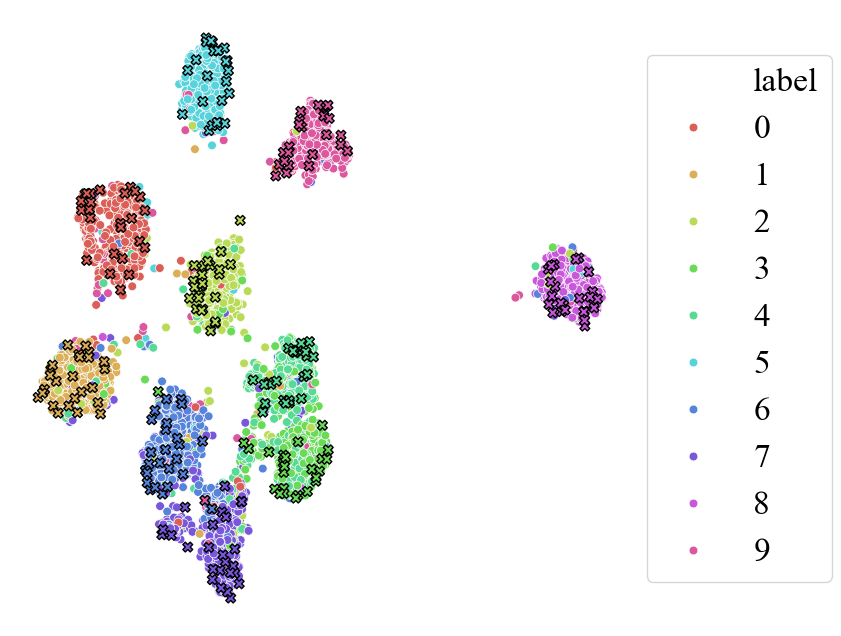

In [181]:
plot_latent(train_embedded, train_embedded_sup, train_img_embeds, train_img_embeds_sup, 5000)


# KNN CLASSIFIER ON LATENT REPRESENTATIONS

In [60]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
import numpy as np
import torch.utils
from torch.utils.data import DataLoader, TensorDataset

def train_knn_classifier(data, labels):
    # knn = KNeighborsClassifier(n_neighbors=20)
    knn = LogisticRegression()
    knn.fit(data, labels)
    return knn

def get_knn_dataset(dataset, model):
    data = []
    labels = []
    dl = DataLoader(dataset, batch_size=256)
    for batch in tqdm(dl):
        imgs = batch[0]
        label = batch[1]
        imgs = imgs.to(model.device)
        
        with torch.no_grad():
            representations = model.model.diffusion_model.just_representations(
                imgs,
                torch.zeros(imgs.shape[0], device=model.device),
                pooled=False
            )
            representations = model.transform_representations(representations)
            representations = model.classifier(representations)
        data.append(representations.cpu().numpy())
        labels.append(label)
    return np.concatenate(data), np.concatenate(labels)

def get_task_dataset(dataset, task):
    data = []
    labels = []
    for batch in tqdm(dataset):
        img = batch[0]
        label = batch[1]
        if label in task:
            data.append(img.unsqueeze(0))
            labels.append(label)
    return torch.concat(data), torch.tensor(labels)

# def the_whole_thing(config, tasks_datasets, test_ds, tasks, checkpoint_paths):
#     model_type = config.model.get("model_type")
#     params = config.model.get("params", dict())

#     data = None
#     labels = None
#     config.model.params["ckpt_path"] = checkpoint_paths[-1]
#     model = get_model_class(model_type)(**params)
#     model = model.to(torch.device("cuda"))
#     model.eval()
#     for task_dataset in tqdm(tasks_datasets):
#         data_t, labels_t = get_knn_dataset(task_dataset[0], model)
#         print(data_t.shape, labels_t.shape)
#         data = np.concatenate((data, data_t)) if data is not None else data_t
#         labels = np.concatenate((labels, labels_t)) if labels is not None else labels_t
#         print(data.shape, labels.shape)

#     knn = train_knn_classifier(data, labels)
#     data_t, labels_t = get_knn_dataset(test_ds, model)
#     del model
#     preds = knn.predict(data_t)
#     accuracy = accuracy_score(labels_t, preds)
#     print(f"accuracy task: {accuracy}")
#     return accuracy


def the_whole_thing(config, tasks_datasets, test_ds, tasks, checkpoint_paths):
    model_type = config.model.get("model_type")
    params = config.model.get("params", dict())

    knns = []
    acc = [[] for _ in range(len(tasks))]
    data = None
    labels = None
    task_dataset = tasks_datasets[0][0]
    for checkpoint_path in tqdm(checkpoint_paths):
        config.model.params["ckpt_path"] = checkpoint_path
        model = get_model_class(model_type)(**params)
        model = model.to(torch.device("cuda"))
        model.eval()
        data, labels = get_knn_dataset(task_dataset, model)
        print(data.shape, labels.shape)
        del model
        # data = np.concatenate((data, data_t)) if data is not None else data_t
        # labels = np.concatenate((labels, labels_t)) if labels is not None else labels_t
        print(data.shape, labels.shape)

        knn = train_knn_classifier(data, labels)
        knns.append(knn)
    classes = tasks[0]
    data, labels = get_task_dataset(test_ds, classes)
    for i, checkpoint_path in tqdm(enumerate(checkpoint_paths)):
        for j, knn in enumerate(knns[:i+1]):
            config.model.params["ckpt_path"] = checkpoint_path
            model = get_model_class(model_type)(**params)
            model = model.to(torch.device("cuda"))
            model.eval()
            data_t, labels_t = get_knn_dataset(TensorDataset(data, labels), model)
            del model
            preds = knn.predict(data_t)
            accuracy = accuracy_score(labels_t, preds)
            print(f"accuracy task {i} model {j}: {accuracy}")
            acc[j].append(accuracy)
    return acc


In [61]:
import torch
from omegaconf import OmegaConf
from tqdm import tqdm
from dataloading import get_datasets
from models import get_model_class


config_path = "configs/standard_diffusion/continual_learning/joint_diffusion_pooling/cifar100/5_tasks/cifar100_sigle_task.yaml"
checkpoint_paths = [
    "pulled_checkpoints/cifar100_t5/t1.ckpt",
    "pulled_checkpoints/cifar100_t5/t2_s12.ckpt",
    "pulled_checkpoints/cifar100_t5/t3_s12.ckpt",
    "pulled_checkpoints/cifar100_t5/t4_s12.ckpt",
    "pulled_checkpoints/cifar100_t5/t5_s12.ckpt",
]

config = OmegaConf.load(config_path)

dl_config_orig = config.pop("dataloaders")
dl_config = OmegaConf.to_container(dl_config_orig, resolve=True)
tasks_datasets, tasks_bs, test_ds, test_bs, tasks = get_datasets(dl_config)

the_whole_thing(config, tasks_datasets, test_ds, tasks, checkpoint_paths)

Files already downloaded and verified
Files already downloaded and verified


  0%|          | 0/5 [00:00<?, ?it/s]

JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t1.ckpt with 446 missing and 466 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bias', 'model_ema.diffusion_modelinp

100%|██████████| 40/40 [00:02<00:00, 15.95it/s]


(10000, 1024) (10000,)
(10000, 1024) (10000,)


 20%|██        | 1/5 [00:07<00:29,  7.46s/it]

JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t2_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bias', 'model_ema.diffusion_mod

100%|██████████| 40/40 [00:02<00:00, 17.07it/s]


(10000, 1024) (10000,)
(10000, 1024) (10000,)


/home/pawel/miniconda3/envs/ldm/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 40%|████      | 2/5 [00:15<00:23,  7.76s/it]

JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t3_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bias', 'model_ema.diffusion_mod

100%|██████████| 40/40 [00:02<00:00, 15.81it/s]


(10000, 1024) (10000,)
(10000, 1024) (10000,)


/home/pawel/miniconda3/envs/ldm/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 60%|██████    | 3/5 [00:24<00:16,  8.50s/it]

JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t4_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bias', 'model_ema.diffusion_mod

100%|██████████| 40/40 [00:02<00:00, 15.86it/s]


(10000, 1024) (10000,)
(10000, 1024) (10000,)


/home/pawel/miniconda3/envs/ldm/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 80%|████████  | 4/5 [00:33<00:08,  8.69s/it]

JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t5_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bias', 'model_ema.diffusion_mod

100%|██████████| 40/40 [00:02<00:00, 15.97it/s]


(10000, 1024) (10000,)
(10000, 1024) (10000,)


/home/pawel/miniconda3/envs/ldm/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
100%|██████████| 10000/10000 [00:00<00:00, 35942.48it/s]
0it [00:00, ?it/s]

JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t1.ckpt with 446 missing and 466 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bias', 'model_ema.diffusion_modelinp

100%|██████████| 8/8 [00:00<00:00, 17.18it/s]
1it [00:01,  1.67s/it]

accuracy task 0 model 0: 0.8865
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t2_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers

100%|██████████| 8/8 [00:00<00:00, 17.28it/s]


accuracy task 1 model 0: 0.8515
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t2_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers

100%|██████████| 8/8 [00:00<00:00, 17.39it/s]
2it [00:05,  3.16s/it]

accuracy task 1 model 1: 0.8735
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t3_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers

100%|██████████| 8/8 [00:00<00:00, 17.26it/s]


accuracy task 2 model 0: 0.7715
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t3_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers

100%|██████████| 8/8 [00:00<00:00, 17.26it/s]


accuracy task 2 model 1: 0.8165
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t3_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers

100%|██████████| 8/8 [00:00<00:00, 17.31it/s]
3it [00:12,  4.57s/it]

accuracy task 2 model 2: 0.862
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t4_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0

100%|██████████| 8/8 [00:00<00:00, 17.31it/s]


accuracy task 3 model 0: 0.74
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t4_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0b

100%|██████████| 8/8 [00:00<00:00, 17.17it/s]


accuracy task 3 model 1: 0.778
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t4_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0

100%|██████████| 8/8 [00:00<00:00, 17.34it/s]


accuracy task 3 model 2: 0.78
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t4_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0b

100%|██████████| 8/8 [00:00<00:00, 17.41it/s]
4it [00:20,  6.09s/it]

accuracy task 3 model 3: 0.845
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t5_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0

100%|██████████| 8/8 [00:00<00:00, 17.24it/s]


accuracy task 4 model 0: 0.592
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t5_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0

100%|██████████| 8/8 [00:00<00:00, 17.18it/s]


accuracy task 4 model 1: 0.687
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t5_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0

100%|██████████| 8/8 [00:00<00:00, 17.23it/s]


accuracy task 4 model 2: 0.6915
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t5_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers

100%|██████████| 8/8 [00:00<00:00, 17.26it/s]


accuracy task 4 model 3: 0.7
JointDiffusionAugmentations: Running in eps-prediction mode
DiffusionWrapper has 52.54 M params.
Keeping EMAs of 448.
Restored from pulled_checkpoints/cifar100_t5/t5_s12.ckpt with 446 missing and 2294 unexpected keys
Missing Keys: ['model_ema.diffusion_modeltime_embed0weight', 'model_ema.diffusion_modeltime_embed0bias', 'model_ema.diffusion_modeltime_embed2weight', 'model_ema.diffusion_modeltime_embed2bias', 'model_ema.diffusion_modelinput_blocks00weight', 'model_ema.diffusion_modelinput_blocks00bias', 'model_ema.diffusion_modelinput_blocks10in_layers0weight', 'model_ema.diffusion_modelinput_blocks10in_layers0bias', 'model_ema.diffusion_modelinput_blocks10in_layers2weight', 'model_ema.diffusion_modelinput_blocks10in_layers2bias', 'model_ema.diffusion_modelinput_blocks10emb_layers1weight', 'model_ema.diffusion_modelinput_blocks10emb_layers1bias', 'model_ema.diffusion_modelinput_blocks10out_layers0weight', 'model_ema.diffusion_modelinput_blocks10out_layers0bi

100%|██████████| 8/8 [00:00<00:00, 17.25it/s]
5it [00:30,  6.17s/it]

accuracy task 4 model 4: 0.826


[[0.8865, 0.8515, 0.7715, 0.74, 0.592],
 [0.8735, 0.8165, 0.778, 0.687],
 [0.862, 0.78, 0.6915],
 [0.845, 0.7],
 [0.826]]

In [ ]:
[90.15000463 82.85000324 75.10000467 62.25000024 39.60000277]
[ 0.         71.15000486 60.1000011  45.20000219 27.40000188]
[ 0.          0.         71.15000486 53.75000238 41.40000343]
[ 0.          0.          0.         74.65000153 52.90000439]
[ 0.          0.          0.          0.         79.95000482]]

In [ ]:
classifier knn
[[0.8665, 0.564, 0.306, 0.1715, 0.088],
         [0.856, 0.7255, 0.514, 0.308],
                 [0.83, 0.6875, 0.506],
                        [0.805, 0.6145],
                               [0.767]]
unet knn
[[0.849, 0.728, 0.5615, 0.4425, 0.2425],
        [0.8305, 0.7135, 0.6145, 0.405],
                [0.8175, 0.7275, 0.553],
                        [0.791, 0.589],
                                [0.769]]
unet linreg
[[0.8795, 0.8355, 0.7505, 0.703, 0.626],
          [0.856, 0.7895, 0.7405, 0.662],
                [0.836, 0.7665, 0.7035],
                        [0.8395, 0.726],
                                [0.821]]
classifier linreg
[[0.8865, 0.8515, 0.772, 0.74, 0.5915],
        [0.8735, 0.817, 0.7775, 0.688],
                  [0.8605, 0.78, 0.69],
                        [0.844, 0.701],
                               [0.825]]

unet linreg 0.6387
classifier linreg 0.6421
classifier knn 0.617
unet knn 0.6107

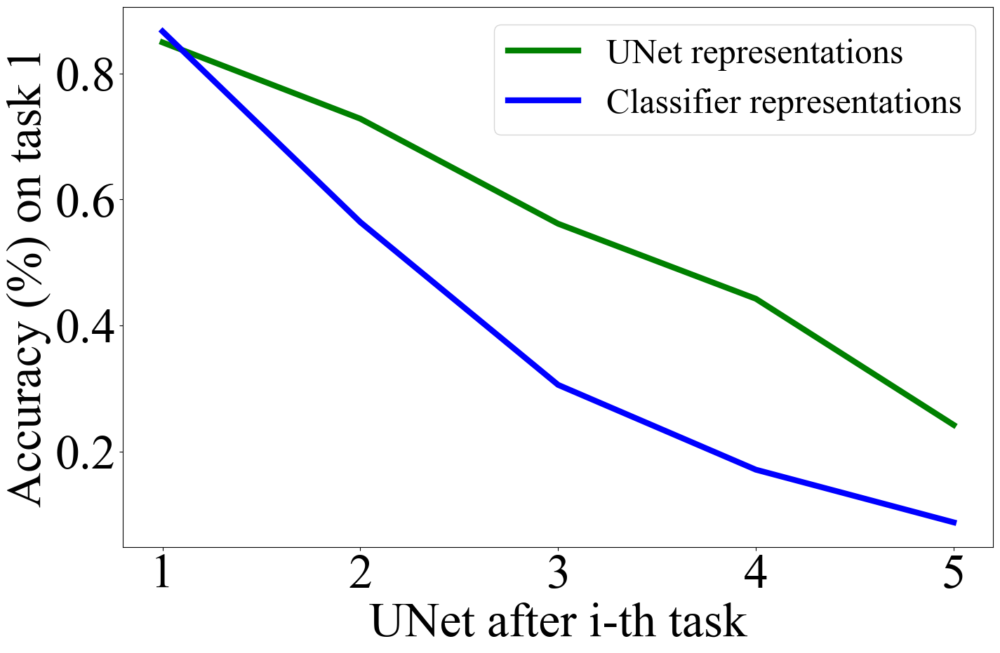

In [12]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['text.usetex'] = False
mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

nice_fonts = {
    # "text.usetex": True,
    "font.family": "serif",
    "font.serif" : "Times New Roman",
    "font.size": 36,
    "axes.labelsize": 50,  
    "xtick.labelsize": 50, 
    "ytick.labelsize": 50,
    "lines.linewidth": 6,
}
mpl.rcParams.update(nice_fonts)

save_fig_opt = {
    'dpi': 800,
    'transparent':True, 
    'bbox_inches':'tight', 
    'pad_inches': 0
}

plt.figure(figsize=(16, 10))
plt.plot([1, 2, 3, 4, 5], [0.849, 0.728, 0.5615, 0.4425, 0.2425], label='UNet representations', color='g')
plt.plot([1, 2, 3, 4, 5], [0.8665, 0.564, 0.306, 0.1715, 0.088], label='Classifier representations', color='b')
# plt.plot([s / 500 for s in resnet_gen_step], resnet_gen_acc_ema, label="ResNet (generations)", color="g")

# Draw a vertical line at x=5
# plt.axvline(x=60000 / 500, color='y', linestyle='--', label='Generative Replay start')

# Add labels and title
plt.xlabel('UNet after i-th task')
plt.ylabel('Accuracy (%) on task 1')
# plt.title('Knowledge transfer effectiveness comparison')

# Add a legend
plt.legend()

plt.savefig("knn.pdf", bbox_inches="tight")
# Show the plot
plt.show()

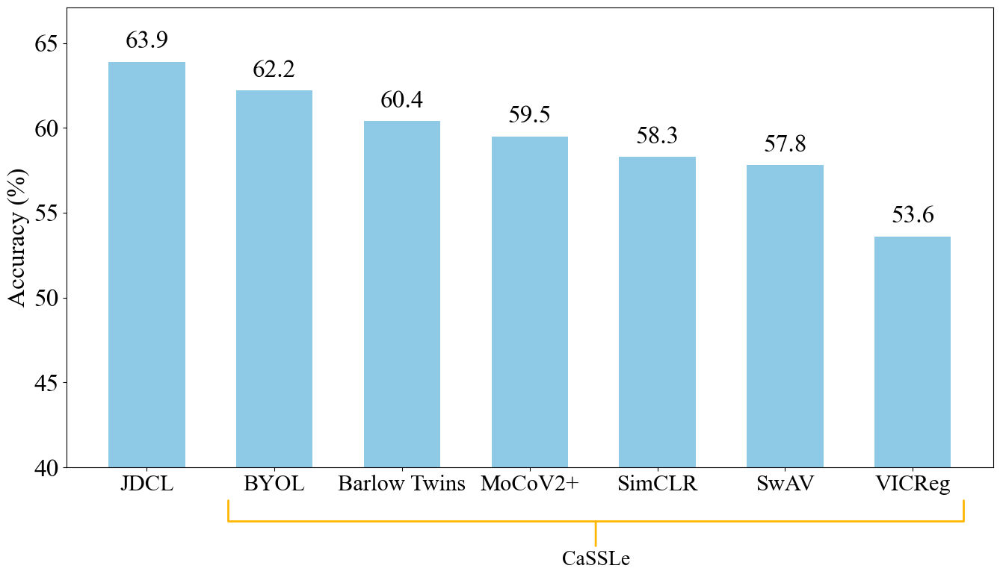

In [141]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['text.usetex'] = False
mpl.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'

nice_fonts = {
    # "text.usetex": True,
    "font.family": "serif",
    "font.serif" : "Times New Roman",
    "font.size": 24,
    "axes.labelsize": 24,  
    "xtick.labelsize": 22, 
    "ytick.labelsize": 24,
    "lines.linewidth": 6,
}
mpl.rcParams.update(nice_fonts)

save_fig_opt = {
    'dpi': 800,
    'transparent':True, 
    'bbox_inches':'tight', 
    'pad_inches': 0
}


# Prepare the data
categories = ["JDCL", "BYOL", "Barlow Twins", "MoCoV2+", "SimCLR", "SwAV", "VICReg"]
values = [63.9, 62.2, 60.4, 59.5, 58.3, 57.8, 53.6]

fig, ax = plt.subplots(figsize=(16, 8))
bars = ax.bar(categories, values, width=0.6, color="#8ECAE6")

ax.set_ylabel('Accuracy (%)')

x = [1, 3] 
y = -1      

for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 0.5, f'{yval:.1f}', ha='center', va='bottom', fontsize=24)


ax.annotate('CaSSLe', xy=(510, -50), xytext=(510, -80), xycoords='axes points', 
            fontsize=20, ha='center', va='top',
            arrowprops=dict(arrowstyle='-[, widthB=17.7, lengthB=1', lw=2.0, color='#FFB703', connectionstyle="arc3,rad=0.0"))
ax.set_ylim(bottom=40)
plt.savefig("self_supervised.pdf", bbox_inches="tight")
plt.show()

In [18]:
import wandb
from datetime import datetime

# Authenticate with wandb if necessary
wandb.login()

# Initialize the wandb API
api = wandb.Api()

# Specify the project name
project_name = "pawel269/Joint-Diffusion-in-Latent-Space"

# Get a list of all runs in the project
runs = api.runs(project_name)

# Initialize total run time
total_run_time = 0

# Iterate over the runs and calculate total run time
for run in runs:
    # print(vars(run))
    start_time = datetime.fromisoformat(run.createdAt)
    end_time = datetime.fromisoformat(run.heartbeatAt)
    duration = end_time - start_time
    total_run_time += duration.total_seconds()

# Convert total seconds to hours
total_run_time_hours = total_run_time / 3600

print("Total run time of all runs:", total_run_time_hours, "hours")

Total run time of all runs: 12502.272222222222 hours
